# Student Dropout and Success - Decision Tree Random Forest

This project will utilize the **Decision Tree and Random Forest** machine learning model to analyze the possible predictors of student dropout and academic success. The factors include demographic data, social-economic factors, and academic performance information.

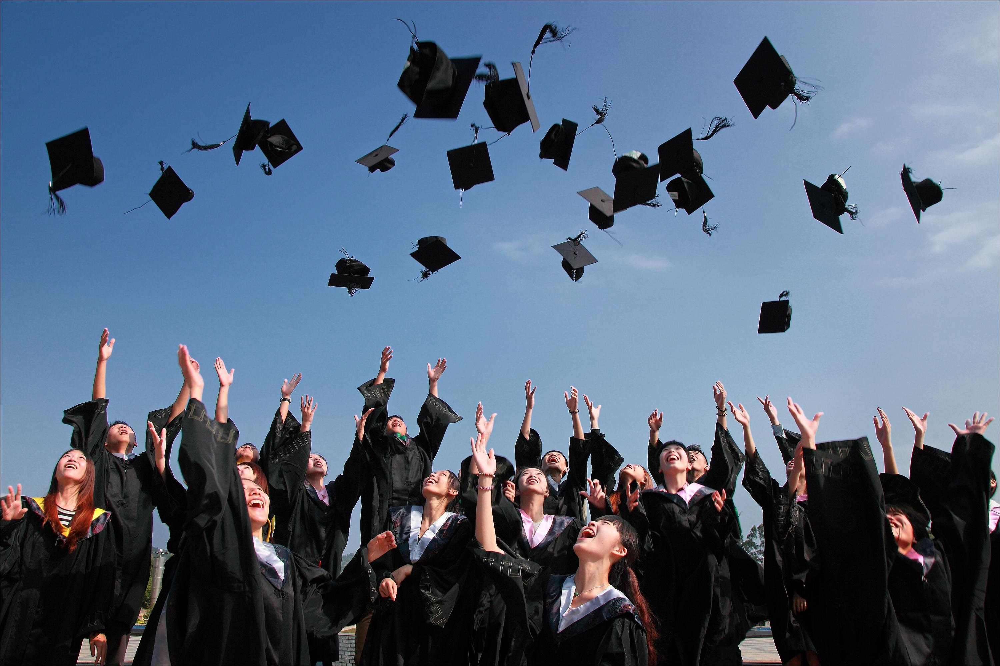

The original dataset can be found here: [Dataset](https://www.kaggle.com/datasets/thedevastator/higher-education-predictors-of-student-retention/data)

# Notebook Content

The notebook will be divided into multiple sections:

1. Import Libraries/Downloading the Data 
2. Prepare the Data for Training
3. Exploratory Data Analysis
4. Training and Interpreting Decision Tree
5. Training and Interpreting Random Forest
6. Hyperparameter Tuning/Final Model Evaluation
7. Conclusion

## Import Libraries/Downloading the Data 

We will begin this project by downloading the necessary libraries and reading the data into a pandas data frame.

### Import Libraries

In [246]:
# Import libraries
import opendatasets as od
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
import plotly.express as px
import matplotlib
%matplotlib inline

# Set parameters for tables and visualizations
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 150)
sns.set_style('darkgrid')
matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.facecolor'] = '#00000000'

# Machine Learning libraries
from sklearn.model_selection import train_test_split # Splits data into sets
from sklearn.impute import SimpleImputer # If any null values, impute them with mean
from sklearn.preprocessing import MinMaxScaler # Scales every numeric value from (0,1)
from sklearn.tree import DecisionTreeClassifier # Decision tree model library
from sklearn.metrics import accuracy_score, confusion_matrix # Computes accuracy score of model and creates confusion matrix
from sklearn.tree import plot_tree, export_text # Creates a visualization of the decision tree
from sklearn.ensemble import RandomForestClassifier # Random Forest model library

### Read the data into the notebook

In [31]:
# Download the csv file
raw_df = pd.read_csv(r"C:\Users\khang\Downloads\dataset.csv")

In [32]:
raw_df

,Marital status,Application mode,Application order,Course,Daytime/evening attendance,Previous qualification,Nacionality,Mother's qualification,Father's qualification,Mother's occupation,Father's occupation,Displaced,Educational special needs,Debtor,Tuition fees up to date,Gender,Scholarship holder,Age at enrollment,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 1st sem (without evaluations),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Curricular units 2nd sem (without evaluations),Unemployment rate,Inflation rate,GDP,Target
0,1,8,5,2,1,1,1,13,10,6,10,1,0,0,1,1,0,20,0,0,0,0,0,0.000000,0,0,0,0,0,0.000000,0,10.8,1.4,1.74,Dropout
1,1,6,1,11,1,1,1,1,3,4,4,1,0,0,0,1,0,19,0,0,6,6,6,14.000000,0,0,6,6,6,13.666667,0,13.9,-0.3,0.79,Graduate
2,1,1,5,5,1,1,1,22,27,10,10,1,0,0,0,1,0,19,0,0,6,0,0,0.000000,0,0,6,0,0,0.000000,0,10.8,1.4,1.74,Dropout
3,1,8,2,15,1,1,1,23,27,6,4,1,0,0,1,0,0,20,0,0,6,8,6,13.428571,0,0,6,10,5,12.400000,0,9.4,-0.8,-3.12,Graduate
4,2,12,1,3,0,1,1,22,28,10,10,0,0,0,1,0,0,45,0,0,6,9,5,12.333333,0,0,6,6,6,13.000000,0,13.9,-0.3,0.79,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4419,1,1,6,15,1,1,1,1,1,6,5,0,0,0,1,1,0,19,0,0,6,7,5,13.600000,0,0,6,8,5,12.666667,0,15.5,2.8,-4.06,Graduate
4420,1,1,2,15,1,1,19,1,1,10,10,1,0,1,0,0,0,18,1,0,6,6,6,12.000000,0,0,6,6,2,11.000000,0,11.1,0.6,2.02,Dropout
4421,1,1,1,12,1,1,1,22,27,10,10,1,0,0,1,0,1,30,0,0,7,8,7,14.912500,0,0,8,9,1,13.500000,0,13.9,-0.3,0.79,Dropout
4422,1,1,1,9,1,1,1,22,27,8,5,1,0,0,1,0,1,20,0,0,5,5,5,13.800000,0,0,5,6,5,12.000000,0,9.4,-0.8,-3.12,Graduate


After taking a glance at the data, we see that there are 4424 rows and 35 columns. We should take note that the categorical columns in the data are already encoded, meaning that no encoding is necessary. 

The **Nacionality** column is misspelled so we need to change this column name during preprocessing. 

There are many columns in the data that may not correlate with the **target** column. Later on we can create a correlation matrix to see which columns do not correlate with the **target** and remove those columns later on to make this analysis and training easier.

Check the data types of these columns

In [33]:
raw_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4424 entries, 0 to 4423
Data columns (total 35 columns):
 #   Column                                          Non-Null Count  Dtype  
---  ------                                          --------------  -----  
 0   Marital status                                  4424 non-null   int64  
 1   Application mode                                4424 non-null   int64  
 2   Application order                               4424 non-null   int64  
 3   Course                                          4424 non-null   int64  
 4   Daytime/evening attendance                      4424 non-null   int64  
 5   Previous qualification                          4424 non-null   int64  
 6   Nacionality                                     4424 non-null   int64  
 7   Mother's qualification                          4424 non-null   int64  
 8   Father's qualification                          4424 non-null   int64  
 9   Mother's occupation                      

There are no null values in the data and it seems as if every input column in the data is numerical since every categorical column is already encoded. Luckily, there is already a **Target** column to make predictions on.

## Preparing the Data for Training

We'll perform the following steps to prepare the dataset for training:

1. Data cleaning
2. Create a train/test/validation split
3. Identify input and target columns
4. Identify Numeric and Categorical Columns
6. Scale numeric values to the **(0, 1)** range

### Data Cleaning

We should rename the **Nacionality** columns to 'Nationality' since it is misspelled.

In [36]:
# Rename column
raw_df.rename(columns={'Nacionality':'Nationality'}, inplace = True)

Let's also remove any columns that have very low correlations when determining the target.

We can do this by creating a copy data frame, encoding the target column, creating a corr matrix to the target, and remove columns that have low correlations.

In [224]:
# Create a copy of data frame
copy_df = raw_df.copy()

In [225]:
print(copy_df["Target"].unique())

['Dropout' 'Graduate' 'Enrolled']


In [226]:
# Turn column into a str so we can change into an int later
copy_df['Target'].astype(str)

0        Dropout
1       Graduate
2        Dropout
3       Graduate
4       Graduate
          ...   
4419    Graduate
4420     Dropout
4421     Dropout
4422    Graduate
4423    Graduate
Name: Target, Length: 4424, dtype: object

We can assign these values with numbers to encode with:

- **Dropout** - 0
- **Graduate** - 1
- **Enrolled** - 2

In [227]:
# Encode values
copy_df['Target'] = copy_df['Target'].map({
    'Dropout': 0,
    'Enrolled': 1,
    'Graduate': 2
})

In [228]:
print(copy_df['Target'].unique())

[0 2 1]


In [230]:
# Turn targets into integers
copy_df['Target'].astype(int)

0       0
1       2
2       0
3       2
4       2
       ..
4419    2
4420    0
4421    0
4422    2
4423    2
Name: Target, Length: 4424, dtype: int32

In [237]:
# Find correlating values with target
corr_df = copy_df.corr()['Target']

In [254]:
# Dataframe for the least correlating features
corr_feature_df = pd.DataFrame({
    'feature': corr_df.index,
    'corr': corr_df.values
}).sort_values('corr', ascending=True)

corr_feature_df

,feature,corr
17,Age at enrollment,-0.243438
13,Debtor,-0.240999
15,Gender,-0.229270
1,Application mode,-0.212025
30,Curricular units 2nd sem (without evaluations),-0.094028
5,Previous qualification,-0.091365
0,Marital status,-0.089804
24,Curricular units 1st sem (without evaluations),-0.068702
7,Mother's qualification,-0.038346
32,Inflation rate,-0.026874


Some columns have negative, and close to 0 correlation to the target column. We can remove these columns to try and make our model more accurate. 

Columns include:

- Age at enrollment
- Debtor
- Gender
- Curricular units 2nd sem (without evaluations)
- Previous qualification
- Marital status
- Curricular units 1st sem (without evaluations)
- Mother's qualification
- Inflation rate
- Educational special needs
- Nationality	

In [256]:
# Remove columns that have little correlation from our actual data set
raw_df = raw_df.drop(columns=['Age at enrollment',
                              'Debtor',
                              'Gender',
                              'Curricular units 2nd sem (without evaluations)',
                              'Previous qualification',
                              'Marital status',
                              'Curricular units 1st sem (without evaluations)',
                              "Mother's qualification",
                              'Inflation rate',
                              'Educational special needs',
                              'Nationality'], axis=1)

In [258]:
raw_df.head()

,Application mode,Application order,Course,Daytime/evening attendance,Father's qualification,Mother's occupation,Father's occupation,Displaced,Tuition fees up to date,Scholarship holder,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Unemployment rate,GDP,Target
0,8,5,2,1,10,6,10,1,1,0,0,0,0,0,0,0.000000,0,0,0,0,0.000000,10.8,1.74,Dropout
1,6,1,11,1,3,4,4,1,0,0,0,0,6,6,6,14.000000,0,6,6,6,13.666667,13.9,0.79,Graduate
2,1,5,5,1,27,10,10,1,0,0,0,0,6,0,0,0.000000,0,6,0,0,0.000000,10.8,1.74,Dropout
3,8,2,15,1,27,6,4,1,1,0,0,0,6,8,6,13.428571,0,6,10,5,12.400000,9.4,-3.12,Graduate
4,12,1,3,0,28,10,10,0,1,0,0,0,6,9,5,12.333333,0,6,6,6,13.000000,13.9,0.79,Graduate


### Train Validation Test Sets

We will split up the data into 60% for training, 20% for validation, and 20% for testing.

In [259]:
train_val_df, test_df = train_test_split(raw_df, test_size=0.2, random_state=42)
train_df, val_df = train_test_split(train_val_df, test_size=0.25, random_state=42)

In [260]:
print('train_df.shape :', train_df.shape)
print('val_df.shape :', val_df.shape)
print('test_df.shape :', test_df.shape)

train_df.shape : (2654, 24)
val_df.shape : (885, 24)
test_df.shape : (885, 24)


### Identify Input and Target Columns

Looking at the data, we can identify every single columns that is not the **Target** column as an input, and keep the **Target** column as the target.

In [261]:
# Identify input and target columns
input_cols = list(train_df.columns)[0:-1] # Chooses every column besides target
target_col = 'Target'

In [262]:
# Training set inputs and targets
train_inputs = train_df[input_cols].copy()
train_targets = train_df[target_col].copy()

In [263]:
# Validation set inputs and targets
val_inputs = val_df[input_cols].copy()
val_targets = val_df[target_col].copy()

In [264]:
# Testing set inputs and targets
test_inputs = test_df[input_cols].copy()
test_targets = test_df[target_col].copy()

### Identify Numeric and Categorical Columns

In [268]:
# Select numeric cols
numeric_cols = train_inputs[['Application order',
                              'Curricular units 1st sem (credited)',
                              'Curricular units 1st sem (enrolled)',
                              'Curricular units 1st sem (evaluations)',
                              'Curricular units 1st sem (approved)',
                              'Curricular units 1st sem (grade)',
                              'Curricular units 2nd sem (credited)',
                              'Curricular units 2nd sem (enrolled)',
                              'Curricular units 2nd sem (evaluations)',
                              'Curricular units 2nd sem (approved)',
                              'Curricular units 2nd sem (grade)',
                              'Unemployment rate',
                              'GDP']].columns.tolist()
numeric_cols

['Application order',
 'Curricular units 1st sem (credited)',
 'Curricular units 1st sem (enrolled)',
 'Curricular units 1st sem (evaluations)',
 'Curricular units 1st sem (approved)',
 'Curricular units 1st sem (grade)',
 'Curricular units 2nd sem (credited)',
 'Curricular units 2nd sem (enrolled)',
 'Curricular units 2nd sem (evaluations)',
 'Curricular units 2nd sem (approved)',
 'Curricular units 2nd sem (grade)',
 'Unemployment rate',
 'GDP']

In [269]:
# Select categorical cols
categorical_cols = train_inputs.columns[~train_inputs.columns.isin(numeric_cols)].tolist()
categorical_cols

['Application mode',
 'Course',
 'Daytime/evening attendance',
 "Father's qualification",
 "Mother's occupation",
 "Father's occupation",
 'Displaced',
 'Tuition fees up to date',
 'Scholarship holder',
 'International']

### Scale numeric values to the **(0, 1)** range

In [270]:
# Create scaler variable
scaler = MinMaxScaler().fit(raw_df[numeric_cols])

In [271]:
# Scale all  numeric columns for each set
train_inputs[numeric_cols] = scaler.transform(train_inputs[numeric_cols])
val_inputs[numeric_cols] = scaler.transform(val_inputs[numeric_cols])
test_inputs[numeric_cols] = scaler.transform(test_inputs[numeric_cols])

### Combine Numeric and Categorical Cols

In [272]:
# Create a training, validation, and testing set with only numeric and categorical cols
X_train = train_inputs[numeric_cols + categorical_cols]
X_val = val_inputs[numeric_cols + categorical_cols]
X_test = test_inputs[numeric_cols + categorical_cols]

## Exploratory Data Analysis

Let's briefly explore the data.

In [273]:
raw_df

,Application mode,Application order,Course,Daytime/evening attendance,Father's qualification,Mother's occupation,Father's occupation,Displaced,Tuition fees up to date,Scholarship holder,International,Curricular units 1st sem (credited),Curricular units 1st sem (enrolled),Curricular units 1st sem (evaluations),Curricular units 1st sem (approved),Curricular units 1st sem (grade),Curricular units 2nd sem (credited),Curricular units 2nd sem (enrolled),Curricular units 2nd sem (evaluations),Curricular units 2nd sem (approved),Curricular units 2nd sem (grade),Unemployment rate,GDP,Target
0,8,5,2,1,10,6,10,1,1,0,0,0,0,0,0,0.000000,0,0,0,0,0.000000,10.8,1.74,Dropout
1,6,1,11,1,3,4,4,1,0,0,0,0,6,6,6,14.000000,0,6,6,6,13.666667,13.9,0.79,Graduate
2,1,5,5,1,27,10,10,1,0,0,0,0,6,0,0,0.000000,0,6,0,0,0.000000,10.8,1.74,Dropout
3,8,2,15,1,27,6,4,1,1,0,0,0,6,8,6,13.428571,0,6,10,5,12.400000,9.4,-3.12,Graduate
4,12,1,3,0,28,10,10,0,1,0,0,0,6,9,5,12.333333,0,6,6,6,13.000000,13.9,0.79,Graduate
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4419,1,6,15,1,1,6,5,0,1,0,0,0,6,7,5,13.600000,0,6,8,5,12.666667,15.5,-4.06,Graduate
4420,1,2,15,1,1,10,10,1,0,0,1,0,6,6,6,12.000000,0,6,6,2,11.000000,11.1,2.02,Dropout
4421,1,1,12,1,27,10,10,1,1,1,0,0,7,8,7,14.912500,0,8,9,1,13.500000,13.9,0.79,Dropout
4422,1,1,9,1,27,8,5,1,1,1,0,0,5,5,5,13.800000,0,5,6,5,12.000000,9.4,-3.12,Graduate


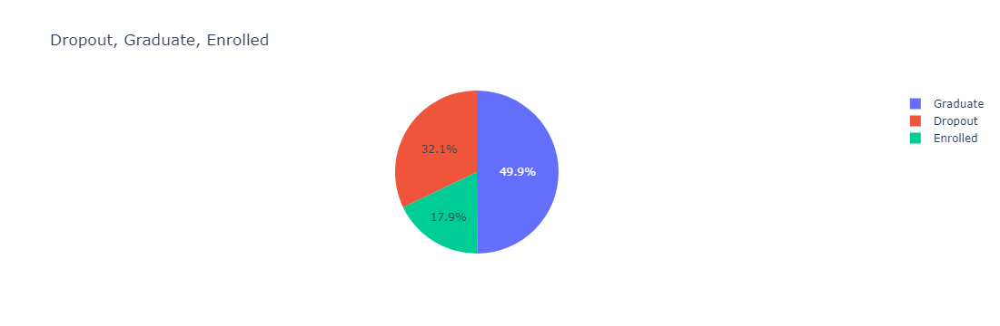

In [274]:
# Create a data frame of counts of targets
target_df = raw_df['Target'].value_counts()

# Pie chart showing counts of dropouts, graduates, and enrolled
fig = px.pie(
    target_df,
    values=target_df.values,
    names=target_df.index,
    title='Dropout, Graduate, Enrolled',
    color=target_df.index,
)

fig.show();

Created a pie chart to see the counts of each target:

- **Graduates** - 2209, 49.9%
- **Dropout** - 1421, 32.1%
- **Enrolled** - 794, 17.9%

We see that there is a larger number of graduates compared to dropouts and currently enrolled students.

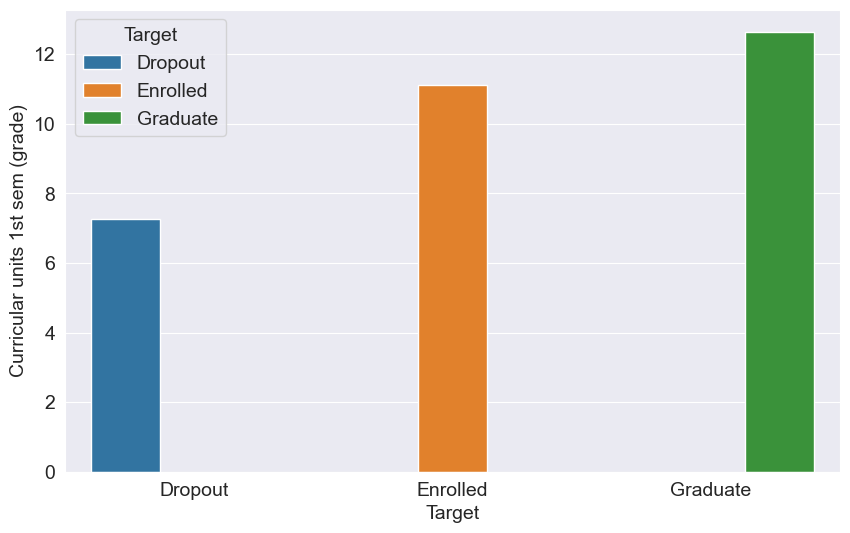

In [382]:
# Find average 1st sem grade units per target
avg_grade_by_target = raw_df.groupby('Target')['Curricular units 1st sem (grade)'].mean().reset_index()

# Create a bar chart
sns.barplot(
    data=avg_grade_by_target,
    x='Target',
    y='Curricular units 1st sem (grade)',
    hue='Target');

We see that dropouts have the lowest average amount of grade units in the 1st semester, while graduates have the highest, let's see if this is the case for the 2nd semester.

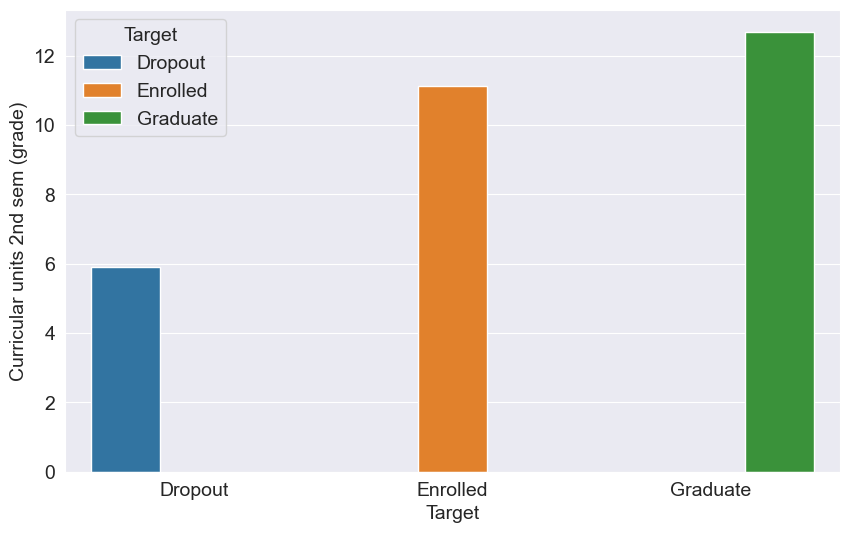

In [383]:
# Find average 2nd sem grade units per target
avg_grade_by_target = raw_df.groupby('Target')['Curricular units 2nd sem (grade)'].mean().reset_index()

# Create a bar chart
sns.barplot(
    data=avg_grade_by_target,
    x='Target',
    y='Curricular units 2nd sem (grade)',
    hue='Target');

There is an even lower amount of grade units for dropouts compared to the 1st semester.

## Training and Interpreting Decision Tree

We can now move on to training our decision tree which can be split up into multiple sections:

1. Training
2. Evaluation
3. Visualization

### Training 

Let's begin by training our decision tree model with the training set of data.

In [276]:
# Create the model
model = DecisionTreeClassifier(random_state=42)

In [277]:
# Fit the model to our training set
model.fit(X_train, train_targets)

DecisionTreeClassifier(random_state=42)

### Evaluation 

Let's evaluate how accurate our model is after the training

In [278]:
# Output predictions
train_preds = model.predict(X_train)

In [279]:
train_preds

array(['Graduate', 'Dropout', 'Graduate', ..., 'Dropout', 'Enrolled',
       'Graduate'], dtype=object)

In [280]:
# Compute accuracy score of our model
accuracy_score(train_preds, train_targets)

1.0

The training set accuracy is 100% and this may be due to overfitting, which means our decision tree has completely memorized every input. 

We will not rely just on the training set to make sure our model is accurate, lets evaluate this model on our validation set as well

In [281]:
# Evaluate the score on validation set
model.score(X_val, val_targets)

0.6813559322033899

As expected, the model did worse on the validation set since the model has learned the training examples perfectly and doesn't predict well to  unseen examples, which is a phenomenon called 'overfitting'

We must reduce overfitting to make this model more accurate.

### Visualization

Let's see how our decision tree learned the data and its process of how it comes up its decisions.

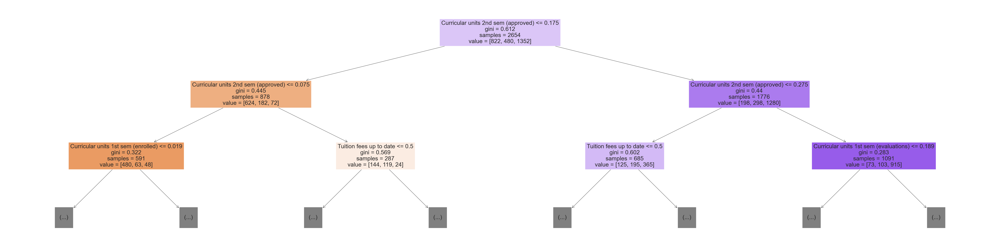

In [282]:
# Visualize decision tree
plt.figure(figsize=(80,20))
plot_tree(model, feature_names=X_train.columns, max_depth=2, filled=True);

We can take note of the value of the Gini index in each split. The closer the Gini index is to 0, the better the split it has to create decisions. 

Notice that the Gini indexes for each split are relatively high around 0.4-0.6, we should identify the most important features and create custom hyperparameter tuning to make the model more accurate

## Training and Interpreting Random Forest

Now, let's train our random forest to see how accurate this model is when predicting the target compared to our decision tree.

1. Training
2. Evaluation
3. Visualization

### Training

In [283]:
# Create our decision tree model
model = RandomForestClassifier(n_jobs=-1, random_state=42)

In [284]:
# Train our model
model.fit(X_train, train_targets)

RandomForestClassifier(n_jobs=-1, random_state=42)

In [285]:
# Compute score of model on training set
model.score(X_train, train_targets)

1.0

In [286]:
# Compute score of model on validation set
model.score(X_val, val_targets)

0.7638418079096045

There is a 10% increase of accuracy using the random forest compared to the decision tree for our validation test.

### Visualization

Compare our random forest to the decision tree.

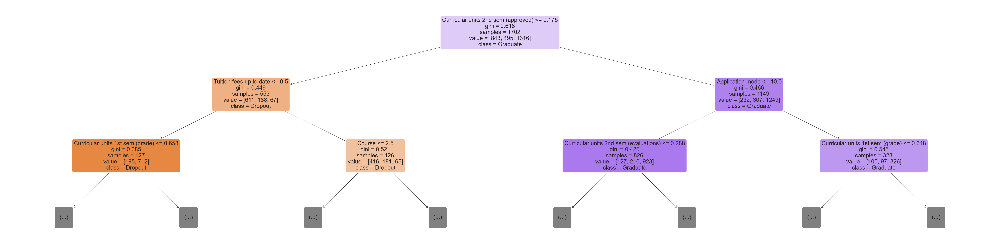

In [287]:
# Create visual for random forest
plt.figure(figsize=(80,20))
plot_tree(model.estimators_[0], max_depth=2, feature_names=X_train.columns, filled=True, rounded=True, class_names=model.classes_);

The Gini index seems a bit lower compared to our decision tree, however we can still do some hyperparameter tuning to make the model even more accurate.

## Hyperparameter Tuning

After training and evaluating our models, we are not satisfied with the accuracy score.

We can find the most important features for this model and tune the hyperparameters to make sure the random forest model is more accurate.

1. Feature Importance
2. n_estimator tuning
3. max_depth tuning
4. max_feature tuning

### Feature Importance

Determine which features hold the most weight.

In [288]:
# Dataframe for the top 10 important features
importance_df = pd.DataFrame({
    'feature': X_train.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

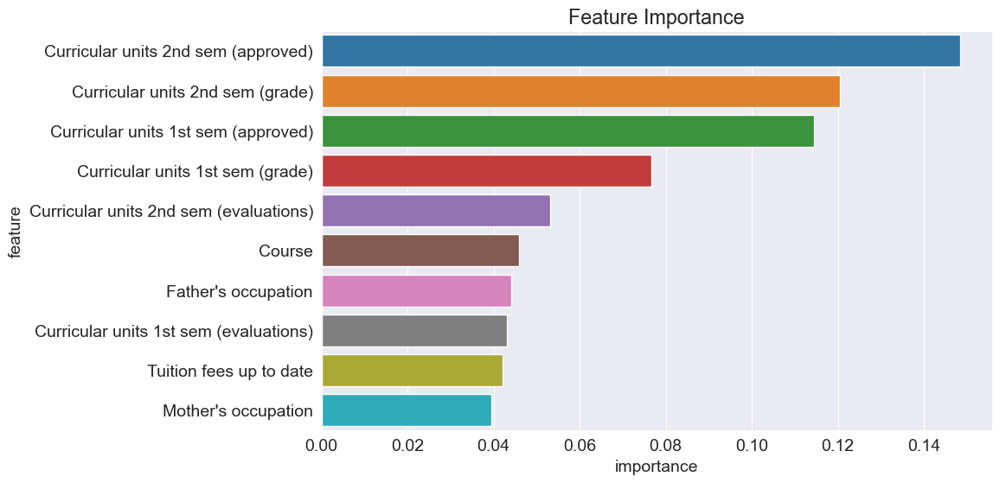

In [289]:
# Create visual of important features
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

These are the top 10 features that have the highest importance/weight when predicting the targets.

### n_estimator tuning

Let's try to find the optimal amount of n_estimators to make the validation error as small as possible. 

Generally, the less estimators there are the better.

In [290]:
# Create a function to help us find the training and validation error for n_estimators
def n_estimator(n):
    model = RandomForestClassifier(n_estimators=n, random_state=42)
    model.fit(X_train, train_targets)
    train_acc = 1 - model.score(X_train, train_targets)
    val_acc = 1 - model.score(X_val, val_targets)
    return {'N Estimators': n, 'Training Error': train_acc, 'Validation Error': val_acc}

# Generate errors for a range of n_estimators (e.g., from 10 to 150 with a step of 20)
n_estimators_range = range(10, 71, 20)
errors_list = [n_estimator(n) for n in n_estimators_range]

# Create a DataFrame from the list of dictionaries
errors_df = pd.DataFrame(errors_list)

In [291]:
errors_df

,N Estimators,Training Error,Validation Error
0,10,0.006782,0.273446
1,30,0.000754,0.245198
2,50,0.000000,0.244068
3,70,0.000000,0.237288


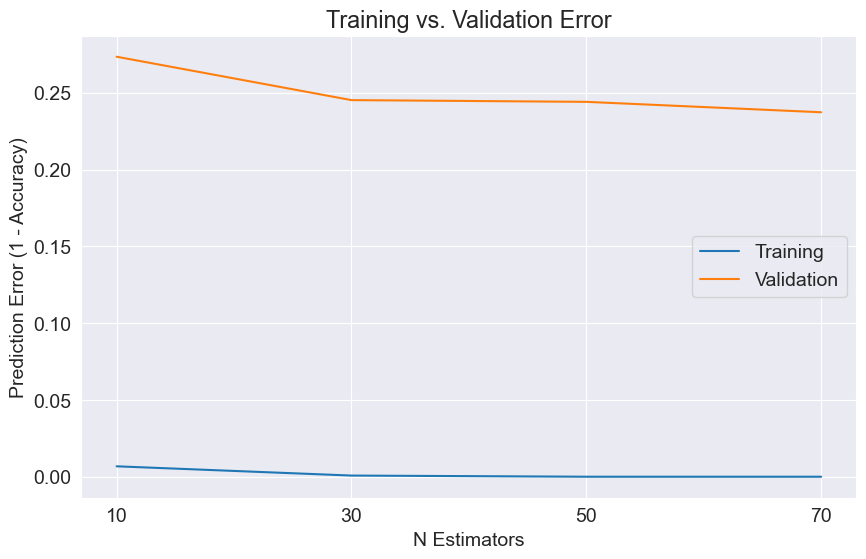

In [292]:
# Visualize the training vs validation error
plt.figure()
plt.plot(errors_df['N Estimators'], errors_df['Training Error'])
plt.plot(errors_df['N Estimators'], errors_df['Validation Error'])
plt.title('Training vs. Validation Error')
plt.xticks(range(10, 71, 20))
plt.xlabel('N Estimators')
plt.ylabel('Prediction Error (1 - Accuracy)')
plt.legend(['Training', 'Validation']);

The point where the validation error is the lowest is around **70** estimators.

### max_depth tuning

By reducing the maximum depth of the decision tree, we can prevent the tree from memorizing all training examples, which may lead to better generalization

In [293]:
# Create function to help us find training vs validation error for max_depth
def max_depth_error(md):
    model = RandomForestClassifier(max_depth=md, random_state=42)
    model.fit(X_train, train_targets)
    train_acc = 1 - model.score(X_train, train_targets)
    val_acc = 1 - model.score(X_val, val_targets)
    return {'Max Depth': md, 'Training Error': train_acc, 'Validation Error': val_acc}

In [294]:
# Turn the errors into a dataframe
errors_df = pd.DataFrame([max_depth_error(md) for md in range(1,21)])

In [295]:
errors_df

,Max Depth,Training Error,Validation Error
0,1,0.304446,0.312994
1,2,0.278448,0.289266
2,3,0.270535,0.282486
3,4,0.253580,0.270056
4,5,0.223060,0.254237
5,6,0.188772,0.245198
6,7,0.160136,0.231638
7,8,0.122457,0.237288
8,9,0.100226,0.240678
9,10,0.077619,0.235028


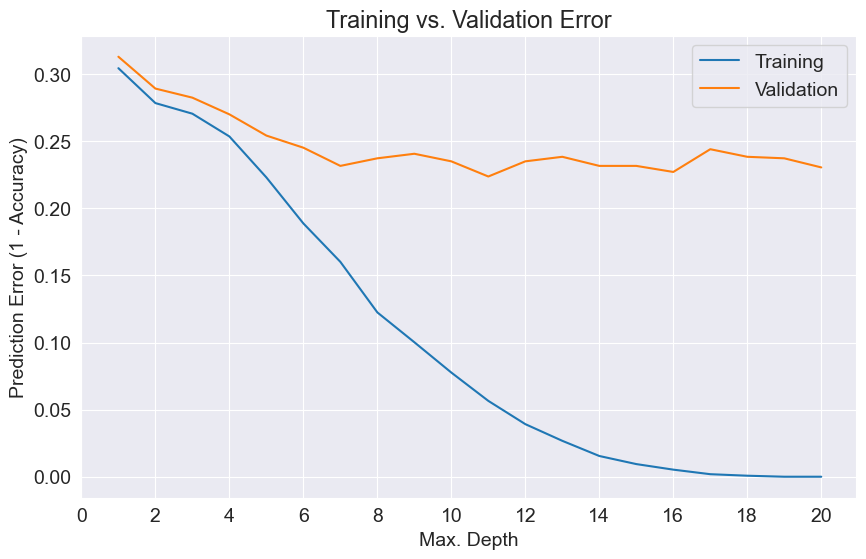

In [296]:
# Visual of training vs validation errors
plt.figure()
plt.plot(errors_df['Max Depth'], errors_df['Training Error'])
plt.plot(errors_df['Max Depth'], errors_df['Validation Error'])
plt.title('Training vs. Validation Error')
plt.xticks(range(0,21, 2))
plt.xlabel('Max. Depth')
plt.ylabel('Prediction Error (1 - Accuracy)')
plt.legend(['Training', 'Validation']);

The lowest validation error is at about **11** max_depth.

### max_feature tuning

Instead of picking all features (columns) for every split, we can specify that only a fraction of features be chosen randomly to figure out a split.


In [297]:
def test_params(**params):
    model = RandomForestClassifier(random_state=42, n_jobs=-1, **params).fit(X_train, train_targets)
    return model.score(X_train, train_targets), model.score(X_val, val_targets)

In [298]:
test_params(max_features=3)

(1.0, 0.7638418079096045)

In [299]:
test_params(max_features=7)

(1.0, 0.7581920903954802)

In [343]:
test_params(max_features=20)

(1.0, 0.768361581920904)

In [301]:
test_params(max_features=30)

(1.0, 0.7638418079096045)

In [302]:
test_params(max_features=31)

(1.0, 0.7638418079096045)

The amount of max_features that can be included where the validation is the highest is around **20**.

### Putting it together

Now, we can apply all of our tuned hyperparameters to the model to see how accurate it is now.

In [347]:
 model = RandomForestClassifier(n_jobs=-1, 
                               random_state=42, 
                               n_estimators=50,
                               max_features=20,
                               max_depth=11)

In [348]:
model.fit(X_train, train_targets)

RandomForestClassifier(max_depth=11, max_features=20, n_estimators=50,
                       n_jobs=-1, random_state=42)

### Final Model Evaluation

Determine the final accuracy scores of each set of data.

In [354]:
train_acc = model.score(X_train, train_targets)
print('Training Accuracy: {:.2f}% '.format(train_acc*100))

Training Accuracy: 95.86% 


In [355]:
val_acc = model.score(X_val, val_targets)
print('Validation Accuracy: {:.2f}% '.format(val_acc*100))

Validation Accuracy: 77.06% 


In [356]:
test_acc = model.score(X_test, test_targets)
print('Testing Accuracy: {:.2f}% '.format(test_acc*100))

Testing Accuracy: 74.46% 


## Conclusion

After the preprocessing, exploratory data analysis, training, and evaluation, we can now conclude our findings.

As a way to improve my model accuracy for validation and testing sets, I tried to tune certain hyperparameters in the random forest models. Some params I tuned included n_estimators, max_features, and max_depth. Ultimately, I did not get the desired accuracy score I wanted for the final testing set, which was at 74.46% accuracy.

For future projects, I will see if I need to manipulate other parameters to get a more accurate score, but ultimately I am happy with a 74.46% score, considering this is my first DTRF model.